<a href="https://colab.research.google.com/github/frankgama/CS111-Intro-to-Scientific-Computing/blob/main/Homework4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [136]:
#Homework 4 COMPSCI 111 UCSB Summer 2025, Frank Gama
#I confirm that I did not use ChatGPT
#or codes from the web or from past years’ assignments and that the work
#I submit is my own and my own only.

#I have been using Google colab since this is the easiest for me at the moment

import os
import time
import math
import numpy as np
import numpy.linalg as npla
import scipy
from scipy import linalg as spla
import scipy.sparse
import scipy.sparse.linalg
from scipy import integrate
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import axes3d
%matplotlib inline
np.set_printoptions(precision = 4)

#I have to connect my colab to my drive every time I make a project
from google.colab import drive
drive.mount('/content/drive/')

# Now that I am connected, I need to be able to access the CS111 File and its
# contents
import os, sys, pathlib
PKG_NAME = "CS111"
PKG_DIR = f"/content/drive/MyDrive/{PKG_NAME}"
PARENT = os.path.dirname(PKG_DIR)




#this makes sure I connected correctly and that my kernel has access to my files
if PARENT not in sys.path:
    sys.path.insert(0, PARENT)

import cs111.LU as LU
from google.colab import files
uploaded = files.upload()

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


Saving Paris.jpg to Paris (4).jpg


For this homework we are tasked with applying what we learned about singular value decomposition (SVD) to understand its role in image compression.  

Given an image represented as a matrix  
$$
A \in \mathbb{R}^{m \times n},
$$  

SVD allows us to write  
$$
A = U \Sigma V^T,
$$  

where $U$ is an $m \times m$ orthogonal matrix that forms a basis for $\mathbb{R}^m$, $\Sigma$ is an $m \times n$ diagonal matrix containing the singular values of $A$, and $V^T$ is an $n \times n$ orthogonal matrix that forms a basis for $\mathbb{R}^n$. By construction, we are able to decompose $A$ into three unique matrices which, when multiplied, give us back the original $A$.  

This is helpful for compression because the diagonal entries of $\Sigma$ (the singular values) are ordered from largest to smallest. By eliminating the smaller singular values, we reduce the rank of the approximation. In the context of images, this lower rank corresponds to a loss of detail: the more singular values we discard, the more information we throw away. However, since the smallest singular values contribute the least, removing them first allows us to keep the essential structure of the image while still reducing storage.  

By keeping only the largest $k$ singular values and setting the rest to zero, we obtain a rank-$k$ approximation of $A$. When applied to images, this low-rank approximation reduces the amount of stored information while still capturing the main features of the image. The trade-off is a loss of fine details, which appears as reduced image quality.


In [137]:
#this is image we wish to perform the demonstration
image = plt.imread("Paris.jpg")


Size of matrix M: (534, 800)


Text(0.5, 1.0, 'Original image, 534 by 800 pixels')

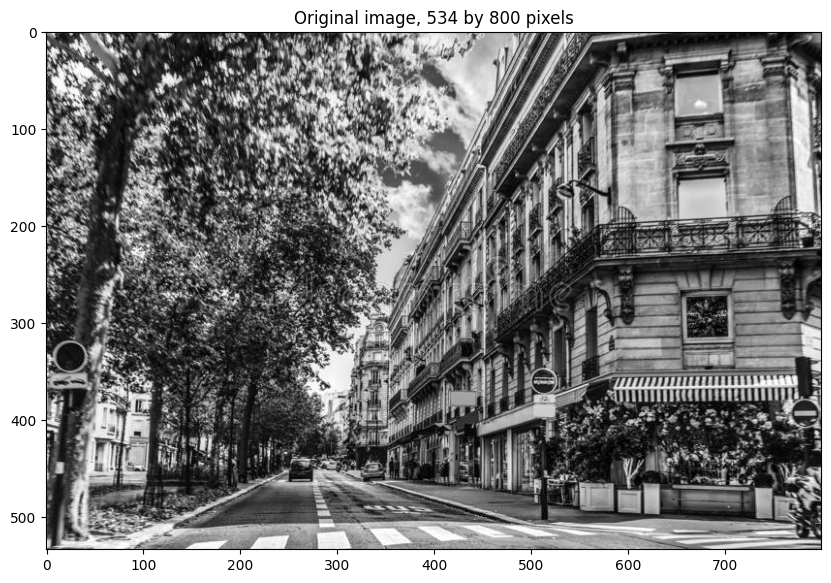

In [138]:

M = np.float64( image[:,:] )
nrows, ncols = M.shape
print( "Size of matrix M:", M.shape )
# Plot the original image (matrix).
plt.figure( figsize=(10, 10) )
plt.gray()
plt.imshow( M )
plt.title( "Original image, {} by {} pixels".format( nrows, ncols ) )

In [139]:
nrows, ncols = M.shape
print( "Storage needed for all of M:", nrows * ncols )

Storage needed for all of M: 427200


I load Paris.jpg and represent it as a 2-D NumPy array $M$, where each entry stores a grayscale pixel intensity. Viewing the image as a matrix lets me apply linear-algebra methods directly (e.g., SVD). I record the dimensions $(n_{\mathrm{rows}}, n_{\mathrm{cols}})$, plot the original image for reference, and compute the full storage cost $n_{\mathrm{rows}}\times n_{\mathrm{cols}}$. This is the baseline I compare against the rank-$k$ SVD storage $k,(n_{\mathrm{rows}} + n_{\mathrm{cols}} + 1)$ when evaluating compression.

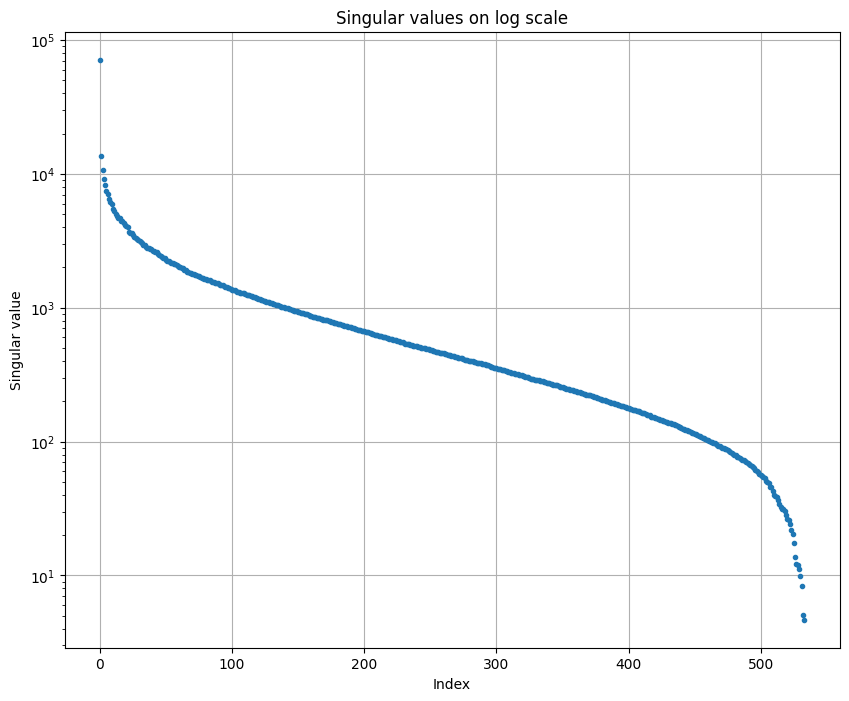

In [140]:
U, sigma, Vt = spla.svd( M )
fig0 = plt.figure( figsize=(10,8) )
plt.plot( sigma, "." )
plt.yscale( "log" )
plt.title( "Singular values on log scale" )
plt.ylabel( "Singular value" )
plt.xlabel( "Index" )
plt.grid()

I plot the singular values of $M$ on a logarithmic scale, which makes it easier to visualize both the large and very small values together. The plot shows that the first singular values (near index 0) carry the most information and variance. As the index increases, the singular values decay, forming a long tail. The tail corresponds to directions that contribute very little to the overall structure of the image. This makes it intuitive that discarding values from the tail will affect the image far less than discarding values from the front.



My goal is to determine the smallest number of singular values needed so that at least 99% of the image’s information is retained. This is based on the Frobenius norm, since the total energy of a matrix is given by the sum of the squares of all its singular values. To achieve the 99% threshold, I look for the minimal $k$ such that the cumulative sum of the first $k$ squared singular values, divided by the total energy, is greater than or equal to $0.99$:

$$
\frac{\sum_{i=1}^{k} \sigma_i^2}{\sum_{i=1}^{r} \sigma_i^2} \;\geq\; 0.99
$$


In [141]:

totalE = float(sum(sigma**2))
rank_k = 0
sumtotal = 0
for i in sigma:
    sumtotal += i**2
    rank_k += 1
    if sumtotal / totalE >= 0.99:
        break
print("Rank-k = ", rank_k)
print(f"Information preserved = {(sumtotal/totalE)*100:.4f}%")




Rank-k =  150
Information preserved = 99.0018%


For this image, we find that keeping $k = 150$ singular values preserves at least 99% of the total Frobenius energy.


2-norm(M) = 71289.46367646568
 sigma[0] = 71289.46367646566

2-norm(M150-M) = 928.6894691582509
 sigma[150] = 928.6894691582506

Relative error = 0.01302702280624441

Storage needed for all of M: 427200
Storage needed for M150:  200250

Compression factor: 2.1333333333333333


Text(0.5, 1.0, 'Compressed image, rank 150')

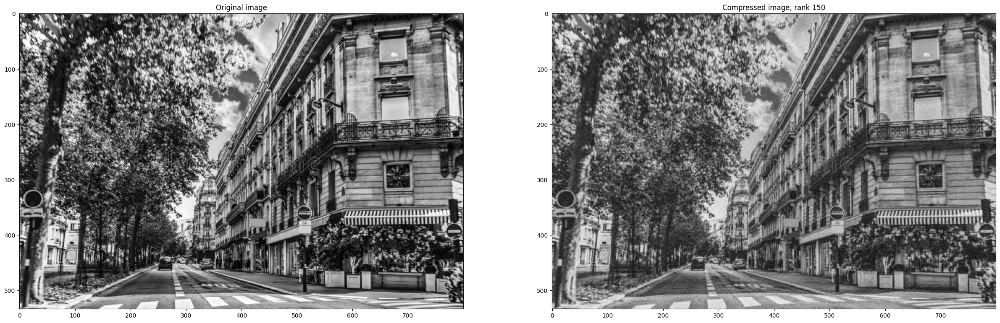

In [142]:
k = 150

nrows, ncols = M.shape
Mk = np.zeros( M.shape )
for i in range( k ):
    Mk += sigma[i] * np.outer( U[:,i], Vt[i,:] )
print( "2-norm(M) =", npla.norm( M, 2 ) )
print( " sigma[0] =", sigma[0] )
print()
print( "2-norm(M{}-M) =".format( k ), npla.norm( Mk - M, 2 ) )
print( " sigma[{}] =".format( k ), sigma[k] )
print()
print( "Relative error =", sigma[k] / sigma[0] )
print()
Mstorage = nrows * ncols
Mkstorage = k * (nrows + ncols + 1)
print( "Storage needed for all of M:", Mstorage )
print( "Storage needed for M{}: ".format( k ), Mkstorage )
print()
print( "Compression factor:", Mstorage / Mkstorage )
plt.figure(figsize=(30,30))
plt.gray()
plt.subplot(1,2,1)
plt.imshow(M)
plt.title( "Original image")
plt.subplot(1,2,2)
plt.imshow(Mk)
plt.title( "Compressed image, rank {}".format( k ) )

I find that the image remains well-preserved even for relatively small values of *k*. This is interesting because the original image already had some blurriness, particularly near the tree and in objects that appear farther away. The building itself, however, is sharp and well-defined, and across different iterations there is little loss of quality.  

Initially, I thought that since the image had a rank of **534**, preserving **99%** of the information would mean removing only about 5 singular values (since 5 is less than 1%). But as I experimented, I realized I could go as low as **k = 190** and still retain a recognizable, detailed image. Personally, I prefer the image at no less than 190; below this point, the quality noticeably degrades.  

At smaller values of *k*, the building still retains its textures and details, and even the flowers in front look good. However, the background begins to appear grainy, with a loss of finer details, almost resembling an old 18th-century photograph with low resolution. This balance between compression and quality highlights how well SVD captures the essential features of the image.


2-norm(M) = 71289.46367646568
 sigma[0] = 71289.46367646566

2-norm(M190-M) = 713.4788756902525
 sigma[190] = 713.478875690252

Relative error = 0.010008195305385477

Storage needed for all of M: 427200
Storage needed for M190:  253650

Compression factor: 1.6842105263157894


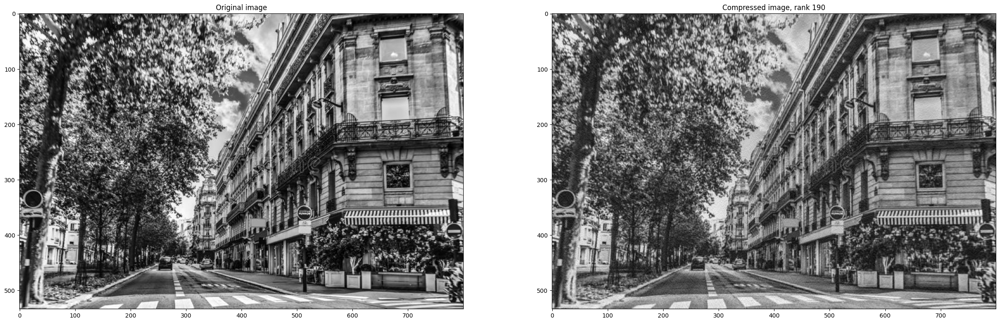

Energy retained at k=175: 99.2837%


In [143]:
k = 190

nrows, ncols = M.shape
Mk = np.zeros( M.shape )
for i in range( k ):
    Mk += sigma[i] * np.outer( U[:,i], Vt[i,:] )
print( "2-norm(M) =", npla.norm( M, 2 ) )
print( " sigma[0] =", sigma[0] )
print()
print( "2-norm(M{}-M) =".format( k ), npla.norm( Mk - M, 2 ) )
print( " sigma[{}] =".format( k ), sigma[k] )
print()
print( "Relative error =", sigma[k] / sigma[0] )
print()
Mstorage = nrows * ncols
Mkstorage = k * (nrows + ncols + 1)
print( "Storage needed for all of M:", Mstorage )
print( "Storage needed for M{}: ".format( k ), Mkstorage )
print()
print( "Compression factor:", Mstorage / Mkstorage )
plt.figure(figsize=(30,30))
plt.gray()
plt.subplot(1,2,1)
plt.imshow(M)
plt.title( "Original image")
plt.subplot(1,2,2)
plt.imshow(Mk)
plt.title( "Compressed image, rank {}".format( k ) )
plt.show()
E175 = np.sum(sigma[:175]**2) / np.sum(sigma**2)
print(f"Energy retained at k=175: {E175*100:.4f}%")

2-norm(M) = 71289.46367646568
 sigma[0] = 71289.46367646566

2-norm(M529-M) = 11.133326783888181
 sigma[529] = 11.133326783888265

Relative error = 0.00015617071878131747

Storage needed for all of M: 427200
Storage needed for M529:  706215

Compression factor: 0.6049149338374291


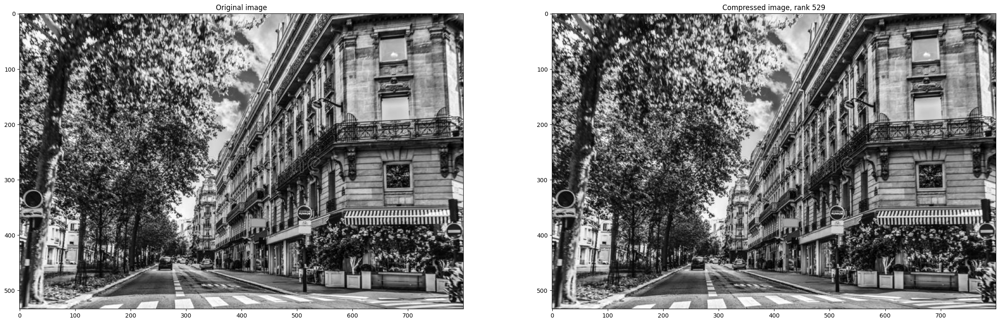

Energy retained at k=529: 99.999994835%


In [144]:
k = 529

nrows, ncols = M.shape
Mk = np.zeros( M.shape )
for i in range( k ):
    Mk += sigma[i] * np.outer( U[:,i], Vt[i,:] )
print( "2-norm(M) =", npla.norm( M, 2 ) )
print( " sigma[0] =", sigma[0] )
print()
print( "2-norm(M{}-M) =".format( k ), npla.norm( Mk - M, 2 ) )
print( " sigma[{}] =".format( k ), sigma[k] )
print()
print( "Relative error =", sigma[k] / sigma[0] )
print()
Mstorage = nrows * ncols
Mkstorage = k * (nrows + ncols + 1)
print( "Storage needed for all of M:", Mstorage )
print( "Storage needed for M{}: ".format( k ), Mkstorage )
print()
print( "Compression factor:", Mstorage / Mkstorage )
plt.figure(figsize=(30,30))
plt.gray()
plt.subplot(1,2,1)
plt.imshow(M)
plt.title( "Original image")
plt.subplot(1,2,2)
plt.imshow(Mk)
plt.title( "Compressed image, rank {}".format( k ) )
plt.show()
E529 = np.sum(sigma[:529]**2) / np.sum(sigma**2)
print(f"Energy retained at k=529: {E529*100:.9f}%")

2-norm(M) = 71289.46367646568
 sigma[0] = 71289.46367646566

2-norm(M450-M) = 113.8434832168159
 sigma[450] = 113.84348321681588

Relative error = 0.0015969187779764195

Storage needed for all of M: 427200
Storage needed for M450:  600750

Compression factor: 0.7111111111111111
Energy retained at k=450: 99.993480960%


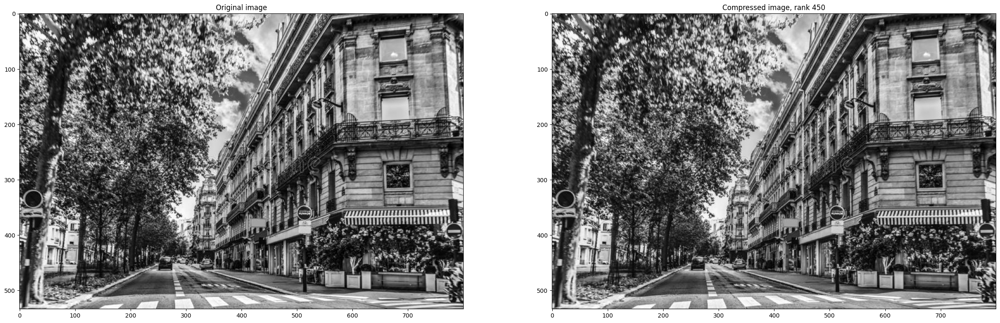

In [145]:
k = 450

nrows, ncols = M.shape
Mk = np.zeros( M.shape )
for i in range( k ):
    Mk += sigma[i] * np.outer( U[:,i], Vt[i,:] )
print( "2-norm(M) =", npla.norm( M, 2 ) )
print( " sigma[0] =", sigma[0] )
print()
print( "2-norm(M{}-M) =".format( k ), npla.norm( Mk - M, 2 ) )
print( " sigma[{}] =".format( k ), sigma[k] )
print()
print( "Relative error =", sigma[k] / sigma[0] )
print()
Mstorage = nrows * ncols
Mkstorage = k * (nrows + ncols + 1)
print( "Storage needed for all of M:", Mstorage )
print( "Storage needed for M{}: ".format( k ), Mkstorage )
print()
print( "Compression factor:", Mstorage / Mkstorage )
plt.figure(figsize=(30,30))
plt.gray()
plt.subplot(1,2,1)
plt.imshow(M)
plt.title( "Original image")
plt.subplot(1,2,2)
plt.imshow(Mk)
plt.title( "Compressed image, rank {}".format( k ) )
E450 = np.sum(sigma[:450]**2) / np.sum(sigma**2)
print(f"Energy retained at k=450: {E450*100:.9f}%")

2-norm(M) = 71289.46367646568
 sigma[0] = 71289.46367646566

2-norm(M300-M) = 353.83344172184064
 sigma[300] = 353.8334417218402

Relative error = 0.004963334320028683

Storage needed for all of M: 427200
Storage needed for M300:  400500

Compression factor: 1.0666666666666667
Energy retained at k=300: 99.870645175%


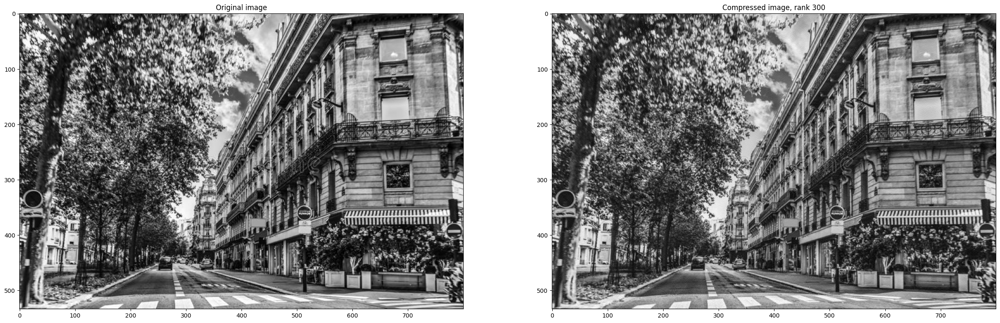

In [146]:
k = 300

nrows, ncols = M.shape
Mk = np.zeros( M.shape )
for i in range( k ):
    Mk += sigma[i] * np.outer( U[:,i], Vt[i,:] )
print( "2-norm(M) =", npla.norm( M, 2 ) )
print( " sigma[0] =", sigma[0] )
print()
print( "2-norm(M{}-M) =".format( k ), npla.norm( Mk - M, 2 ) )
print( " sigma[{}] =".format( k ), sigma[k] )
print()
print( "Relative error =", sigma[k] / sigma[0] )
print()
Mstorage = nrows * ncols
Mkstorage = k * (nrows + ncols + 1)
print( "Storage needed for all of M:", Mstorage )
print( "Storage needed for M{}: ".format( k ), Mkstorage )
print()
print( "Compression factor:", Mstorage / Mkstorage )
plt.figure(figsize=(30,30))
plt.gray()
plt.subplot(1,2,1)
plt.imshow(M)
plt.title( "Original image")
plt.subplot(1,2,2)
plt.imshow(Mk)
plt.title( "Compressed image, rank {}".format( k ) )
E300 = np.sum(sigma[:300]**2) / np.sum(sigma**2)
print(f"Energy retained at k=300: {E300*100:.9f}%")